In [10]:
import xarray as xr
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [2]:
# Define a function to group by season and compute the mean
def group_by_season_mean(ds, var_name):
    return ds[var_name].groupby('time.season').mean(dim='time')

# Define a function to convert the units by multiplying by 1000
def convert_units_to_kg_m2_s(ds, var_name):
    ds[var_name] = ds[var_name] * 1000
    return ds

# Define a function to calculate transport (pr* - qflx*)
def calculate_transport(pr, qflx):
    return pr - qflx

In [3]:
# Define dictionaries for the scenarios
scenarios = {
    'expt1': 'pa-pdSIC-ext',
    'expt2': 'pa-futArcSIC-ext',
    'expt3': 'pa-futAntSIC-ext',
    'expt4': 'pa-pdSIC-2XCO2-ext',
    'expt5': 'pa-futSIC-2XCO2-ext'
}

In [44]:
# Create file paths for qflx and pr datasets
qflx_files = {key: f"/scratch/lvillanu/data/{value}_qflx_mean_each_month.nc" for key, value in scenarios.items()}
pr_files = {key: f"/scratch/lvillanu/data/{value}_pr_mean_each_month.nc" for key, value in scenarios.items()}

# Load qflx datasets
qflx_datasets = {key: xr.open_dataset(filepath) for key, filepath in qflx_files.items()}

# Load pr datasets
pr_datasets = {key: xr.open_dataset(filepath) for key, filepath in pr_files.items()}

# Group by season and compute mean for qflx
qflx_seasonal = {key: group_by_season_mean(ds, 'qflx')*8.64e7/1000 for key, ds in qflx_datasets.items()}

# Group by season, compute mean for pr, and convert units
pr_seasonal = {key: group_by_season_mean(ds, 'pr')*8.64e7 for key, ds in pr_datasets.items()}

# Calculate transport (pr* - qflx*)
transports = {key: calculate_transport(pr_seasonal[key], qflx_seasonal[key]) for key in scenarios.keys()}

In [49]:
pr_datasets

{'expt1': <xarray.Dataset> Size: 666kB
 Dimensions:    (time: 12, bnds: 2, lon: 144, lat: 96)
 Coordinates:
   * time       (time) object 96B 0335-01-01 00:00:00 ... 0334-12-01 00:00:00
   * lon        (lon) float64 1kB 0.0 2.5 5.0 7.5 ... 350.0 352.5 355.0 357.5
   * lat        (lat) float64 768B -90.0 -88.11 -86.21 ... 86.21 88.11 90.0
 Dimensions without coordinates: bnds
 Data variables:
     time_bnds  (time, bnds) object 192B ...
     pr         (time, lat, lon) float32 664kB ...
 Attributes: (12/14)
     CDI:              Climate Data Interface version 2.2.1 (https://mpimet.mp...
     Conventions:      CF-1.0
     source:           CAM
     case:             PAMIP_6.1.hybrid-nudging
     title:            UNSET
     logname:          aaudette
     ...               ...
     revision_Id:      $Id$
     initial_file:     /scratch/p/pjk/aaudette/cesm1_2_2/inputdata/atm/waccm/i...
     topography_file:  /scratch/p/pjk/aaudette/cesm1_2_2/inputdata/atm/cam/top...
     history:        

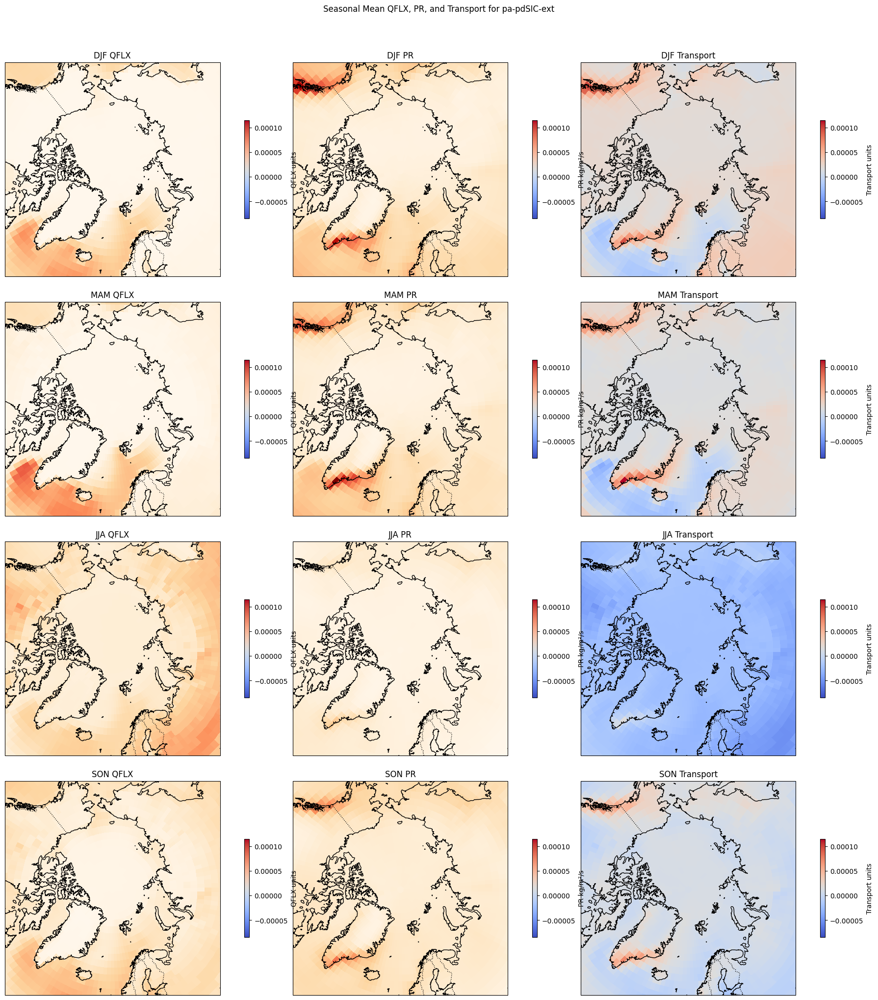

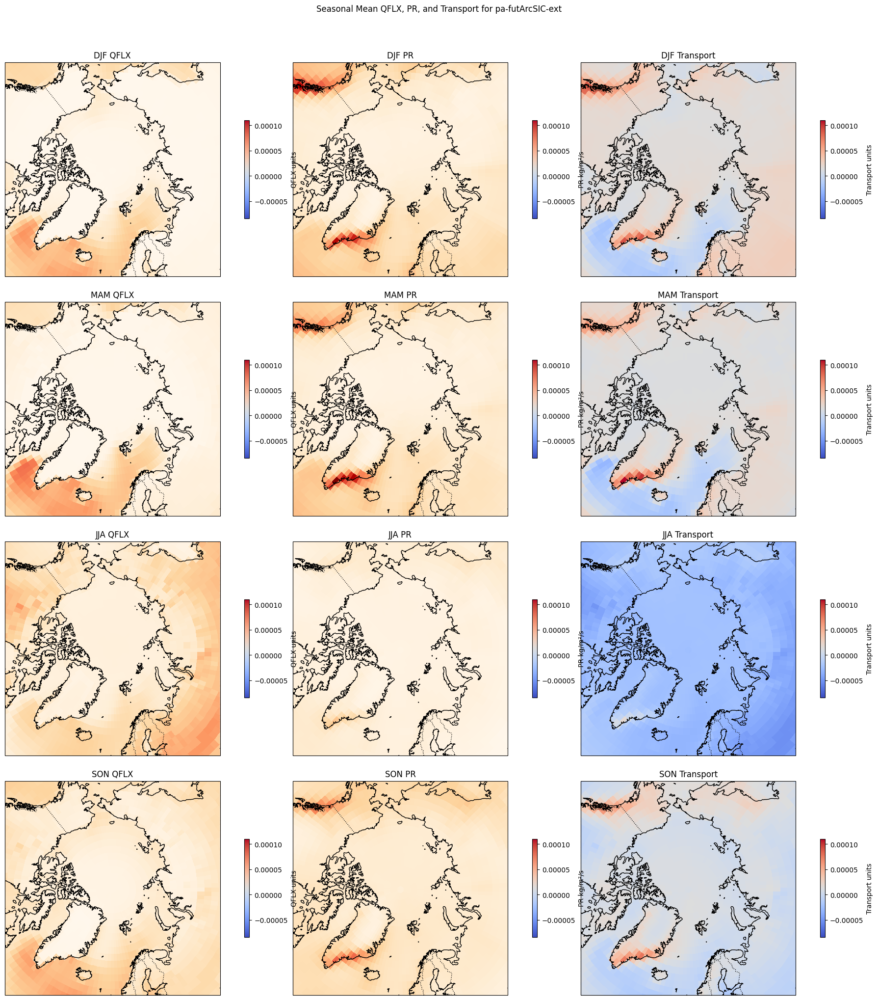

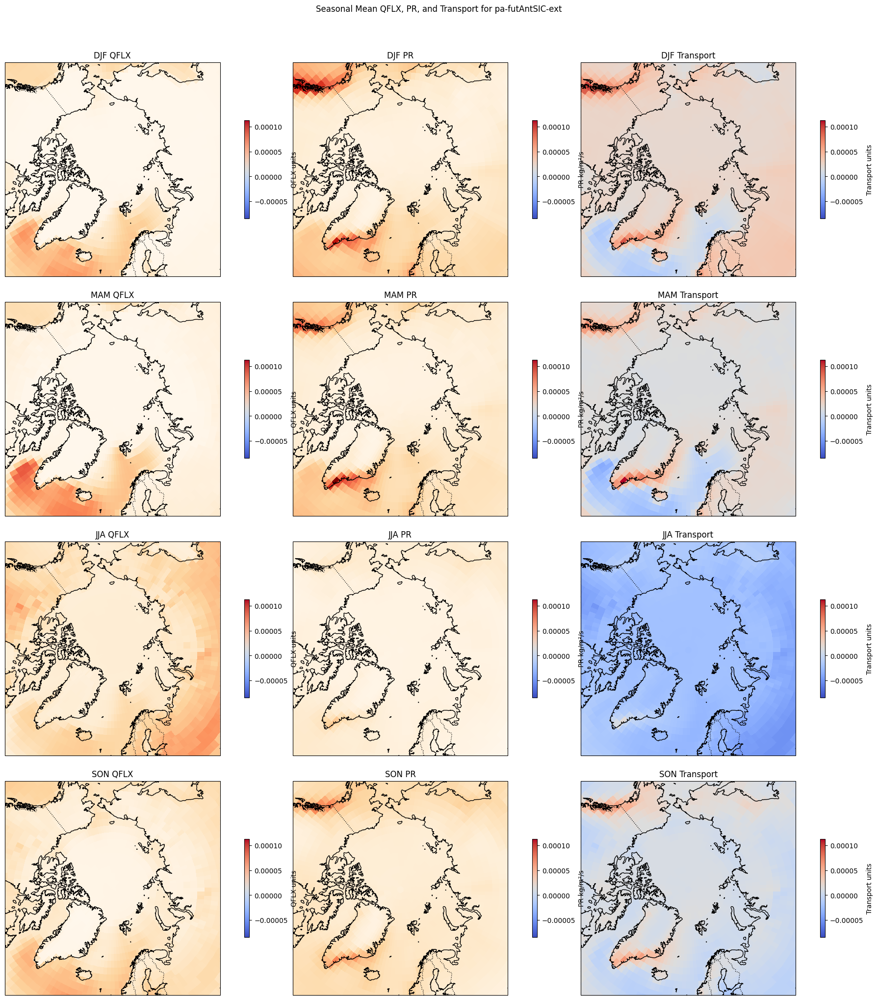

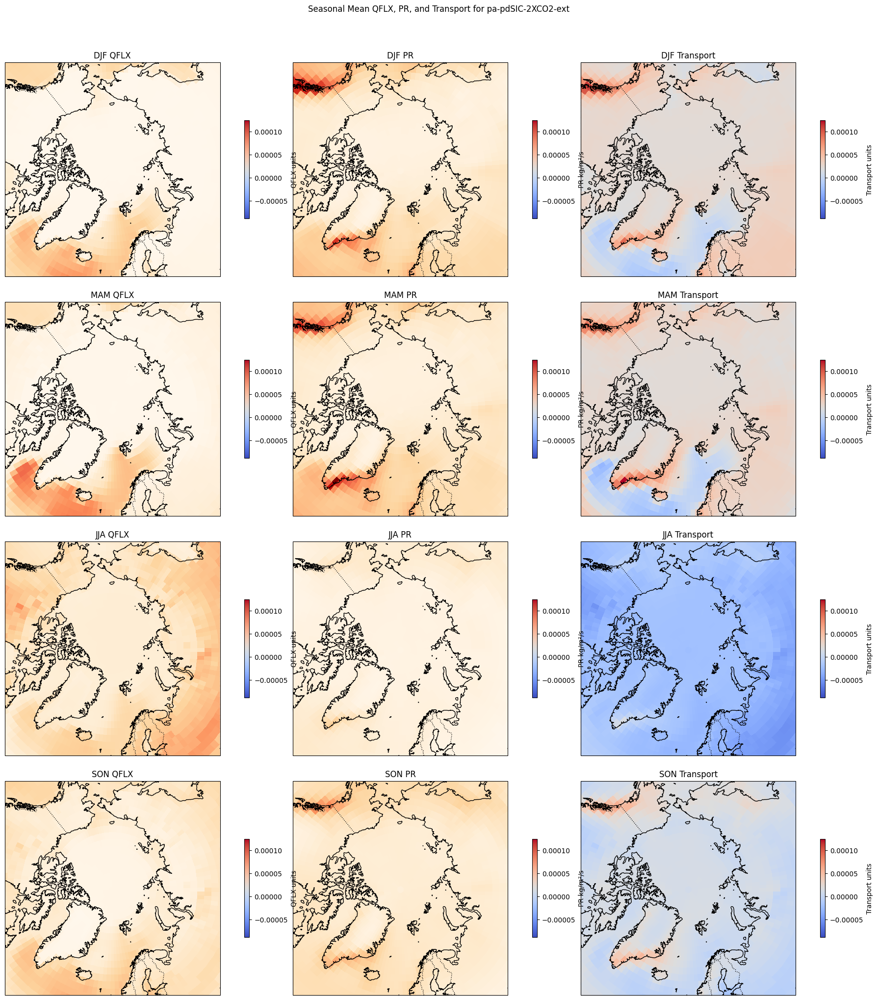

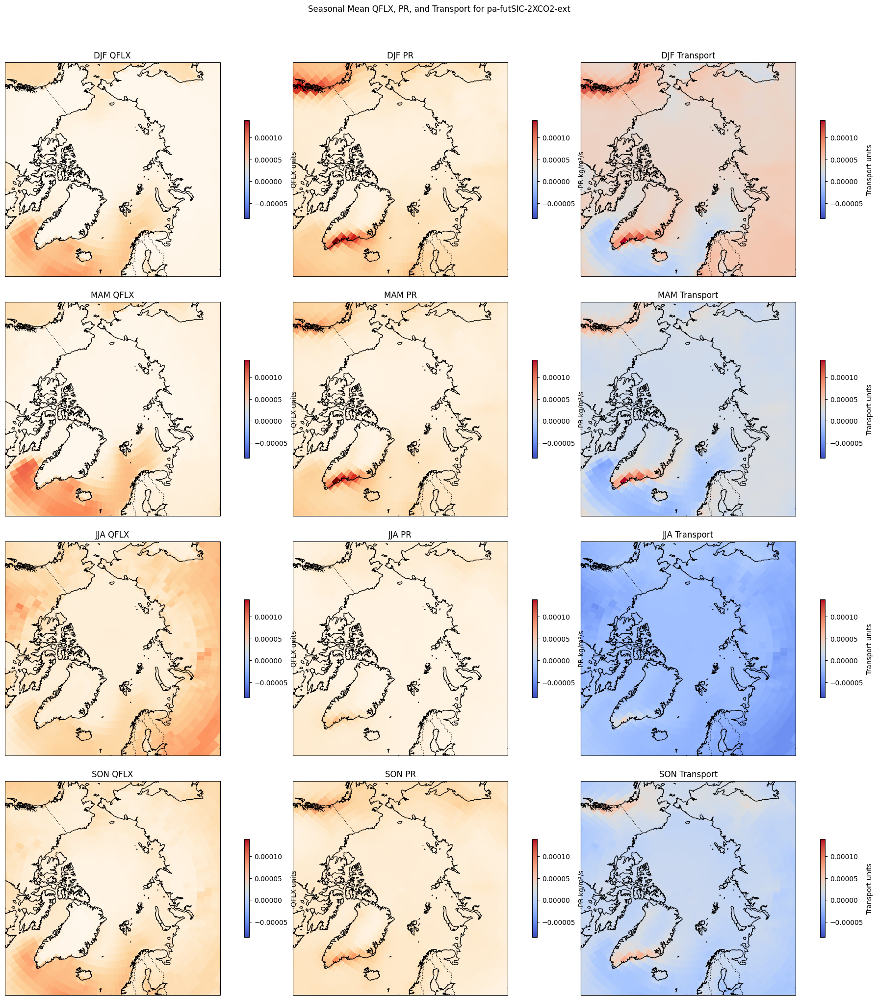

In [20]:
# Define seasons available in the data
seasons = ['DJF', 'MAM', 'JJA', 'SON']

# Plotting
for key, scenario in scenarios.items():
    fig, axes = plt.subplots(nrows=len(seasons), ncols=3, figsize=(18, 20), subplot_kw={'projection': ccrs.NorthPolarStereo()})
    
    for i, season in enumerate(seasons):
        # Extract seasonal means
        qflx_data = qflx_seasonal[key].sel(season=season)
        pr_data = pr_seasonal[key].sel(season=season)
        transport_data = transports[key].sel(season=season)


        # Plot pr
        ax = axes[i, 1]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        c = ax.pcolormesh(pr_data.lon, pr_data.lat, pr_data, transform=ccrs.PlateCarree(), cmap='OrRd')
        ax.set_title(f'{season} PR')
        
        # Plot qflx
        ax = axes[i, 0]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        c = ax.pcolormesh(qflx_data.lon, qflx_data.lat, qflx_data, transform=ccrs.PlateCarree(), cmap='OrRd')
        ax.set_title(f'{season} QFLX')


        # Plot transport
        ax = axes[i, 2]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        c = ax.pcolormesh(transport_data.lon, transport_data.lat, transport_data, transform=ccrs.PlateCarree(), cmap='coolwarm')
        ax.set_title(f'{season} Transport')

    # Add colorbars
    for ax in axes[:, 0]:
        fig.colorbar(c, ax=ax, orientation='vertical', fraction=0.02, pad=0.1, label='QFLX units')
    for ax in axes[:, 1]:
        fig.colorbar(c, ax=ax, orientation='vertical', fraction=0.02, pad=0.1, label='PR kg/m²/s')
    for ax in axes[:, 2]:
        fig.colorbar(c, ax=ax, orientation='vertical', fraction=0.02, pad=0.1, label='Transport units')

    fig.suptitle(f'Seasonal Mean QFLX, PR, and Transport for {scenario}', y=1.02)
    plt.tight_layout()
    plt.show()

    # Save the figure
    filename = f'seasonal_means_{key}.png'
    fig.savefig(filename, dpi=300)

In [21]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

# Define seasons available in the data
seasons = ['DJF', 'MAM', 'JJA', 'SON']

# Plotting
for key, scenario in scenarios.items():
    fig, axes = plt.subplots(nrows=len(seasons), ncols=3, figsize=(18, 20), subplot_kw={'projection': ccrs.NorthPolarStereo()})
    
    for i, season in enumerate(seasons):
        # Extract seasonal means
        qflx_data = qflx_seasonal[key].sel(season=season)
        pr_data = pr_seasonal[key].sel(season=season)
        transport_data = transports[key].sel(season=season)

        # Define a custom colormap for better visualization of masked data
        def mask_out_continent(ax, data):
            """Apply a mask to data and plot it."""
            # Create a mask for the data
            masked_data = np.ma.masked_where(data < 0, data)  # Example condition; adjust as needed
            return ax.pcolormesh(data.lon, data.lat, masked_data, transform=ccrs.PlateCarree(), cmap='OrRd')

        # Plot qflx
        ax = axes[i, 0]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, edgecolor='none', facecolor='none')  # Mask out land
        c = mask_out_continent(ax, qflx_data)
        ax.set_title(f'{season} QFLX')

        # Plot pr
        ax = axes[i, 1]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, edgecolor='none', facecolor='none')  # Mask out land
        c = mask_out_continent(ax, pr_data)
        ax.set_title(f'{season} PR')

        # Plot transport
        ax = axes[i, 2]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.add_feature(cfeature.LAND, edgecolor='none', facecolor='none')  # Mask out land
        c = mask_out_continent(ax, transport_data)
        ax.set_title(f'{season} Transport')

    # Add colorbars
    for ax in axes[:, 0]:
        fig.colorbar(c, ax=ax, orientation='vertical', fraction=0.02, pad=0.1, label='QFLX units')
    for ax in axes[:, 1]:
        fig.colorbar(c, ax=ax, orientation='vertical', fraction=0.02, pad=0.1, label='PR kg/m²/s')
    for ax in axes[:, 2]:
        fig.colorbar(c, ax=ax, orientation='vertical', fraction=0.02, pad=0.1, label='Transport units')

    fig.suptitle(f'Seasonal Mean QFLX, PR, and Transport for {scenario}', y=1.02)
    plt.tight_layout()
    
    # Save the figure
    filename = f'seasonal_means_{key}.png'
    fig.savefig(filename, dpi=300)

/home/netapp-clima/users/ggiulian/m20/lib/python3.10/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


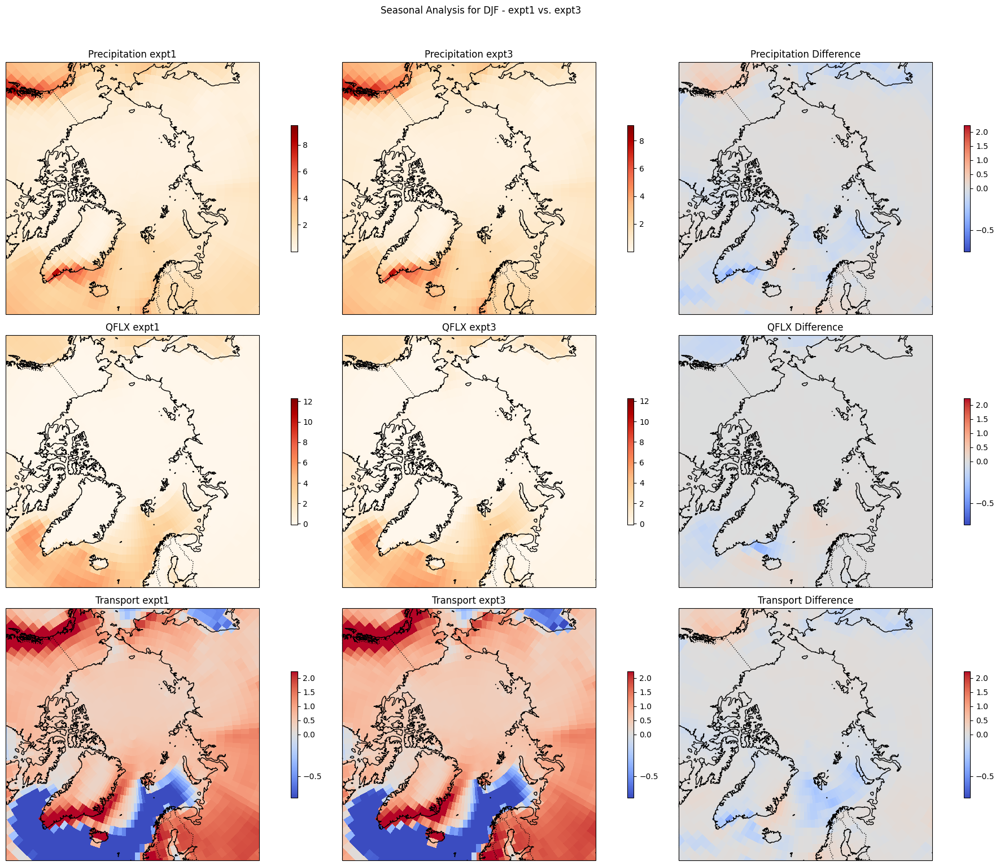

In [50]:
# Define the specific season and experiments
season = 'DJF'
exp1 = 'expt1'
exp2 = 'expt3'

# Extract data for the chosen season and experiments
qflx_exp1 = qflx_seasonal[exp1].sel(season=season)
qflx_exp2 = qflx_seasonal[exp2].sel(season=season)
pr_exp1 = pr_seasonal[exp1].sel(season=season)
pr_exp2 = pr_seasonal[exp2].sel(season=season)
transport_exp1 = transports[exp1].sel(season=season)
transport_exp2 = transports[exp2].sel(season=season)

# Calculate differences
qflx_diff = qflx_exp2 - qflx_exp1
pr_diff = pr_exp2 - pr_exp1
transport_diff = transport_exp2 - transport_exp1

# Plotting
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 15), subplot_kw={'projection': ccrs.NorthPolarStereo()})


# Plot precipitation for exp2
ax = axes[0, 1]
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
c2 = ax.pcolormesh(pr_exp2.lon, pr_exp2.lat, pr_exp2, transform=ccrs.PlateCarree(), cmap='OrRd')
ax.set_title(f'Precipitation {exp2}')

# Plot precipitation for exp1
ax = axes[0, 0]
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
c1 = ax.pcolormesh(pr_exp1.lon, pr_exp1.lat, pr_exp1, transform=ccrs.PlateCarree(), cmap='OrRd')
ax.set_title(f'Precipitation {exp1}')



# Plot difference in precipitation
ax = axes[0, 2]
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
c3 = ax.pcolormesh(pr_diff.lon, pr_diff.lat, pr_diff, transform=ccrs.PlateCarree(), cmap='coolwarm', norm=norm)
ax.set_title(f'Precipitation Difference')


# Plot QFLX for exp2
ax = axes[1, 1]
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
c5 = ax.pcolormesh(qflx_exp2.lon, qflx_exp2.lat, qflx_exp2, transform=ccrs.PlateCarree(), cmap='OrRd')
ax.set_title(f'QFLX {exp2}')

# Plot QFLX for exp1
ax = axes[1, 0]
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
c4 = ax.pcolormesh(qflx_exp1.lon, qflx_exp1.lat, qflx_exp1, transform=ccrs.PlateCarree(), cmap='OrRd')
ax.set_title(f'QFLX {exp1}')



# Plot difference in QFLX
ax = axes[1, 2]
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
c6 = ax.pcolormesh(qflx_diff.lon, qflx_diff.lat, qflx_diff, transform=ccrs.PlateCarree(), cmap='coolwarm', norm=norm)
ax.set_title(f'QFLX Difference')


# Plot transport for exp2
ax = axes[2, 1]
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
c8 = ax.pcolormesh(transport_exp2.lon, transport_exp2.lat, transport_exp2, transform=ccrs.PlateCarree(), cmap='coolwarm', norm=norm)
ax.set_title(f'Transport {exp2}')


# Plot transport for exp1
ax = axes[2, 0]
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
c7 = ax.pcolormesh(transport_exp1.lon, transport_exp1.lat, transport_exp1, transform=ccrs.PlateCarree(), cmap='coolwarm', norm=norm)
ax.set_title(f'Transport {exp1}')


# Plot difference in transport
ax = axes[2, 2]
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')
c9 = ax.pcolormesh(transport_diff.lon, transport_diff.lat, transport_diff, transform=ccrs.PlateCarree(), cmap='coolwarm', norm=norm)
ax.set_title(f'Transport Difference')

# Add colorbars
for ax, c in zip(axes.flatten(), [c1, c2, c3, c4, c5, c6, c7, c8, c9]):
    fig.colorbar(c, ax=ax, orientation='vertical', fraction=0.02, pad=0.1)

fig.suptitle(f'Seasonal Analysis for {season} - {exp1} vs. {exp2}', y=1.02)
plt.tight_layout()

# Save the figure
filename = f'seasonal_analysis_{season}_{exp1}_vs_{exp2}.png'
fig.savefig(filename, dpi=300)

In [45]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature


from matplotlib.colors import TwoSlopeNorm
norm = TwoSlopeNorm(vcenter = 0)

class SeasonalAnalysis:
    def __init__(self, qflx_seasonal, pr_seasonal, transports, scenarios):
        self.qflx_seasonal = qflx_seasonal
        self.pr_seasonal = pr_seasonal
        self.transports = transports
        self.scenarios = scenarios

    def plot_seasonal_comparison(self, season, exp1_key, exp2_key):
        # Get scenario names from keys
        exp1 = self.scenarios[exp1_key]
        exp2 = self.scenarios[exp2_key]
        
        # Extract data for the chosen season and experiments
        qflx_exp1 = self.qflx_seasonal[exp1_key].sel(season=season)
        qflx_exp2 = self.qflx_seasonal[exp2_key].sel(season=season)
        pr_exp1 = self.pr_seasonal[exp1_key].sel(season=season)
        pr_exp2 = self.pr_seasonal[exp2_key].sel(season=season)
        transport_exp1 = self.transports[exp1_key].sel(season=season)
        transport_exp2 = self.transports[exp2_key].sel(season=season)

        # Calculate differences
        qflx_diff = qflx_exp2 - qflx_exp1
        pr_diff = pr_exp2 - pr_exp1
        transport_diff = transport_exp2 - transport_exp1

        # Plotting
        fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 15), subplot_kw={'projection': ccrs.NorthPolarStereo()})

        # Plot precipitation for exp2
        ax = axes[0, 0]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        c2 = ax.pcolormesh(pr_exp2.lon, pr_exp2.lat, pr_exp2, transform=ccrs.PlateCarree(), cmap='OrRd')
        ax.set_title(f'Precipitation {exp2}')
        
        # Plot precipitation for exp1
        ax = axes[0, 1]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        c1 = ax.pcolormesh(pr_exp1.lon, pr_exp1.lat, pr_exp1, transform=ccrs.PlateCarree(), cmap='OrRd')
        ax.set_title(f'Precipitation {exp1}')

        # Plot difference in precipitation
        ax = axes[0, 2]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        c3 = ax.pcolormesh(pr_diff.lon, pr_diff.lat, pr_diff, transform=ccrs.PlateCarree(), cmap='coolwarm', norm = norm)
        ax.set_title(f'Precipitation Difference')

        # Plot QFLX for exp2
        ax = axes[1, 0]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        c5 = ax.pcolormesh(qflx_exp2.lon, qflx_exp2.lat, qflx_exp2, transform=ccrs.PlateCarree(), cmap='OrRd', norm = norm)
        ax.set_title(f'QFLX {exp2}')
        
        # Plot QFLX for exp1
        ax = axes[1, 1]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        c4 = ax.pcolormesh(qflx_exp1.lon, qflx_exp1.lat, qflx_exp1, transform=ccrs.PlateCarree(), cmap='OrRd')
        ax.set_title(f'QFLX {exp1}')

        

        # Plot difference in QFLX
        ax = axes[1, 2]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        c6 = ax.pcolormesh(qflx_diff.lon, qflx_diff.lat, qflx_diff, transform=ccrs.PlateCarree(), cmap='coolwarm')
        ax.set_title(f'QFLX Difference')

        # Plot transport for exp2
        ax = axes[2, 0]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        c8 = ax.pcolormesh(transport_exp2.lon, transport_exp2.lat, transport_exp2, transform=ccrs.PlateCarree(), cmap='coolwarm', norm = norm)
        ax.set_title(f'Transport {exp2}')
        
        # Plot transport for exp1
        ax = axes[2, 1]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        c7 = ax.pcolormesh(transport_exp1.lon, transport_exp1.lat, transport_exp1, transform=ccrs.PlateCarree(), cmap='coolwarm', norm = norm)
        ax.set_title(f'Transport {exp1}')


        # Plot difference in transport
        ax = axes[2, 2]
        ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        c9 = ax.pcolormesh(transport_diff.lon, transport_diff.lat, transport_diff, transform=ccrs.PlateCarree(), cmap='coolwarm', norm = norm)
        ax.set_title(f'Transport Difference')

        # Add colorbars
        for ax, c in zip(axes.flatten(), [c1, c2, c3, c4, c5, c6, c7, c8, c9]):
            fig.colorbar(c, ax=ax, orientation='vertical', fraction=0.02, pad=0.1)

        fig.suptitle(f'Seasonal Analysis for {season} - {exp1} vs. {exp2}', y=1.02)
        plt.tight_layout()

        # Save the figure
        filename = f'seasonal_analysis_{season}_{exp1}_vs_{exp2}.png'
        fig.savefig(filename, dpi=300)
        plt.show()

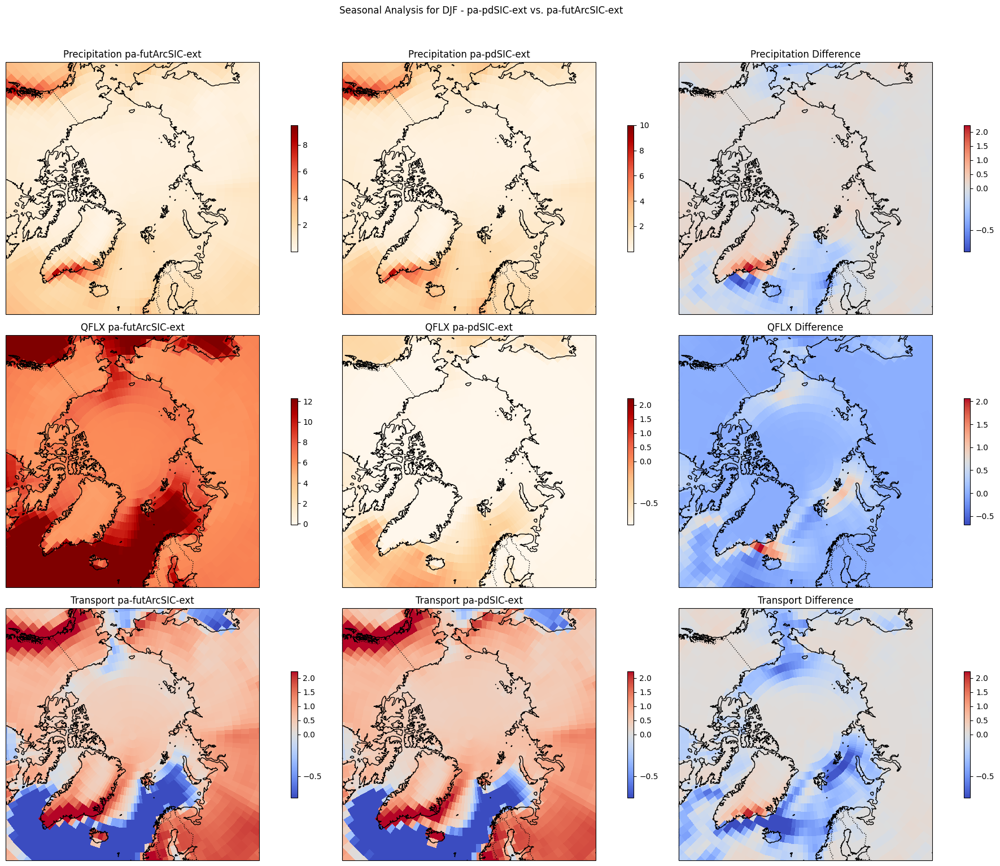

In [46]:
# Define dictionaries for the scenarios
scenarios = {
    'expt1': 'pa-pdSIC-ext',
    'expt2': 'pa-futArcSIC-ext',
    'expt3': 'pa-futAntSIC-ext',
    'expt4': 'pa-pdSIC-2XCO2-ext',
    'expt5': 'pa-futSIC-2XCO2-ext'
}

# Assume `qflx_seasonal`, `pr_seasonal`, and `transports` are already defined as in the mock data creation

# Create an instance of the SeasonalAnalysis class
seasonal_analysis = SeasonalAnalysis(qflx_seasonal, pr_seasonal, transports, scenarios)

# Define the specific season and experiments
season = 'DJF'
exp1_key = 'expt1'
exp2_key = 'expt2'

# Plot and save the comparison
seasonal_analysis.plot_seasonal_comparison(season, exp1_key, exp2_key)

/home/netapp-clima/users/ggiulian/m20/lib/python3.10/site-packages/matplotlib/colors.py:732: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/home/netapp-clima/users/ggiulian/m20/lib/python3.10/site-packages/matplotlib/colors.py:732: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/home/netapp-clima/users/ggiulian/m20/lib/python3.10/site-packages/matplotlib/colors.py:732: RuntimeWarning: overflow encountered in multiply
  xa *= self.N
/home/netapp-clima/users/ggiulian/m20/lib/python3.10/site-packages/matplotlib/colors.py:732: RuntimeWarning: overflow encountered in multiply
  xa *= self.N


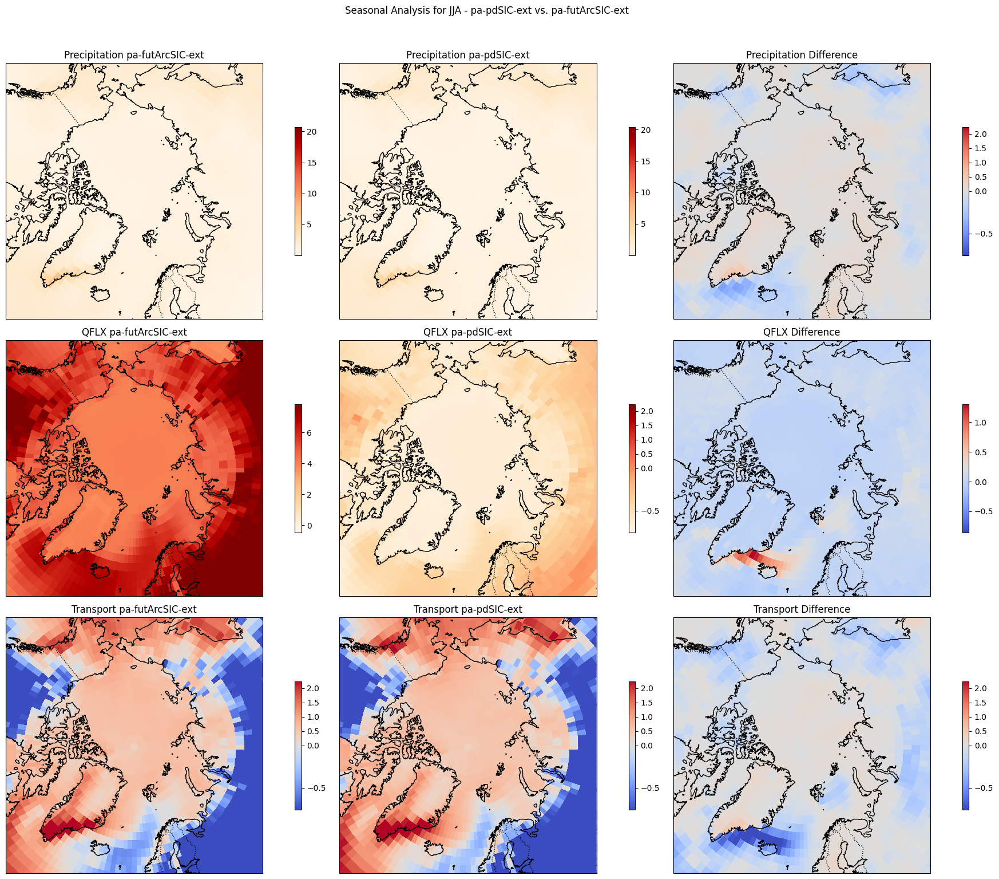

In [47]:
seasonal_analysis = SeasonalAnalysis(qflx_seasonal, pr_seasonal, transports, scenarios)

# Define the specific season and experiments
season = 'JJA'
exp1_key = 'expt1'
exp2_key = 'expt2'

# Plot and save the comparison
seasonal_analysis.plot_seasonal_comparison(season, exp1_key, exp2_key)

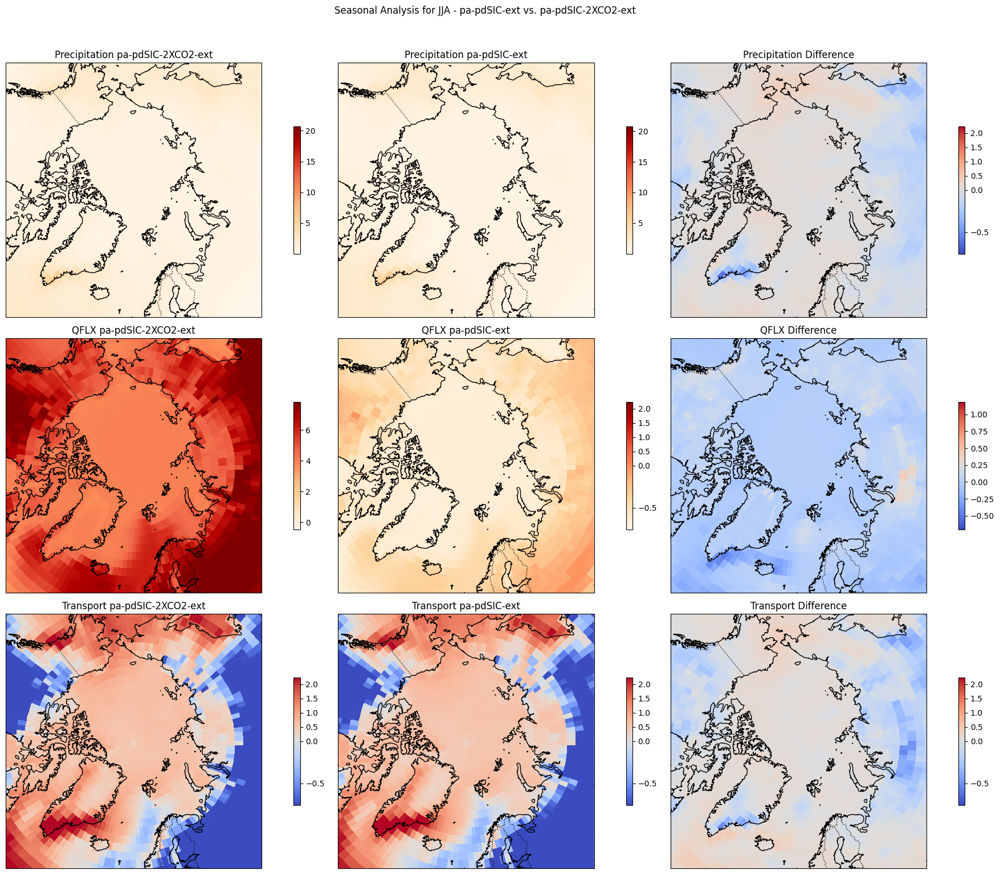

In [48]:
seasonal_analysis = SeasonalAnalysis(qflx_seasonal, pr_seasonal, transports, scenarios)

# Define the specific season and experiments
season = 'JJA'
exp1_key = 'expt1'
exp2_key = 'expt4'

# Plot and save the comparison
seasonal_analysis.plot_seasonal_comparison(season, exp1_key, exp2_key)